In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "6"     # ou 4, ou 5
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from models.unet_simple import Unet
from dataset_sim import *
from loss_ref import ReflectionLoss, psnr

In [3]:
DEVICE = "cuda"
torch.backends.cudnn.benchmark = True


In [ ]:
##Test
# x = torch.randn(4, 3, 256, 256, device=DEVICE)
# out = small_unet.forward(x)
# out.shape

## Inspection of datasets

In [4]:
import numpy as np
import matplotlib.pyplot as plt

from acr_tone import finish
from dataset_sim import *


def show_dataset(ds, n=3, seed=0, title=""):
    """n échantillons tirés au hasard : m | t | m - t."""
    idx = np.random.default_rng(seed).choice(len(ds), min(n, len(ds)), replace=False)
    fig, axes = plt.subplots(len(idx), 3, figsize=(9.5, 3.3 * len(idx)),
                             squeeze=False)
    for row, i in zip(axes, idx):
        s = ds[int(i)]
        m = s["mixed"].permute(1, 2, 0).numpy()
        t = s["transmission"].permute(1, 2, 0).numpy()
        panels = [(m, "mixture m"), (t, "transmission t")]
        for ax, (img, lab) in zip(row, panels):
            ax.imshow(img)
            ax.set_title(lab, fontsize=9)
            ax.set_xticks([]); ax.set_yticks([])
        row[0].set_ylabel(s["name"], fontsize=7)
    fig.suptitle(f"{title}  —  {len(ds)} échantillons", fontsize=12, y=1.0)
    fig.tight_layout()
    plt.show()

### Watching training sources

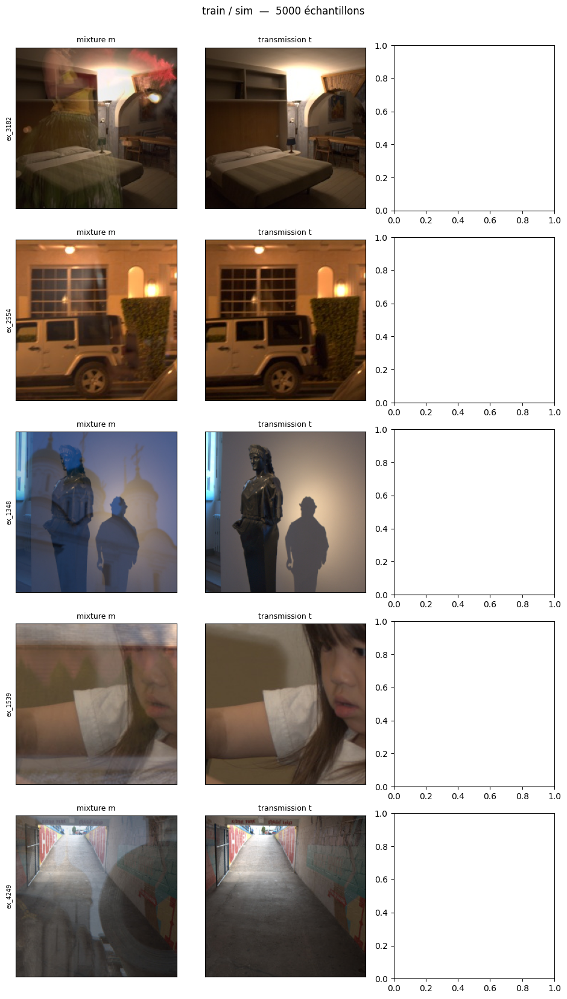

In [6]:
TRAIN = {
    "sim":    SimulatedNpzDataset(npz_dir=SIM_NM, finish=finish, t_key="true_t" ),

}

for name, ds in TRAIN.items():
    show_dataset(ds, n=5, title=f"train / {name}")

### Jeux d'évaluation


In [ ]:
# EVAL = {n: PairedImageDataset(s, size=224, train=False, source=n)
#         for n, s in eval_specs().items()}

# for name, ds in EVAL.items():
#     show_dataset(ds, n=2, title=f"eval / {name}")

In [5]:
data = build_train_loader(finish, batch_size=16, workers=8,size=224, weights=(0.8,0.1, 0.1), simulated=True, npz_dir=SIM_NM, t_key="true_t")

## Entraînement

Le U-Net renvoie `x + inp` : il prédit le **résidu** à retrancher à la mixture,
pas l'image entière. C'est le bon paramétrage ici — à l'initialisation il sort
`pred ≈ m`, donc il part déjà du PSNR de référence au lieu du bruit.

In [8]:
from torch.utils.data import DataLoader, Subset

model = Unet(dim=32, dim_mults=(1, 2,4), channel=3).to(DEVICE).to(memory_format=torch.channels_last)
# ... init à zéro de final_conv ...
model = torch.compile(model)

# Le U-Net renvoie x + inp. Avec une final_conv initialisee au hasard il part de
# m + bruit, soit 6 dB ; a zero il part exactement de m, soit le PSNR de la
# mixture (21 dB). Mesure sur le test de surapprentissage : 23.2 dB a l'iteration
# 0 au lieu de 6.3, et le meme point d'arrivee atteint plus tot.
torch.nn.init.zeros_(model.final_conv.weight)
torch.nn.init.zeros_(model.final_conv.bias)

optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

try:
    loss_f = ReflectionLoss(pixel=1.0, perceptual=0.1, gradient=0.1).to(DEVICE)
except ImportError as e:
    print(f"{e}\n-> terme perceptuel désactivé")
    loss_f = ReflectionLoss(pixel=1.0, perceptual=0.0, gradient=0.1).to(DEVICE)

scaler = torch.amp.GradScaler(DEVICE)
print(f"{sum(p.numel() for p in model.parameters())/1e6:.1f} M paramètres")

1.3 M paramètres


In [9]:
def run_step(batch, net, crit, opt=None, sc=None):
    """Un pas. opt=None -> pas de backward (évaluation)."""
    m =batch["mixed"].to(DEVICE, non_blocking=True).to(memory_format=torch.channels_last)
    t = batch["transmission"].to(DEVICE, non_blocking=True)
    with torch.amp.autocast(DEVICE, enabled=(DEVICE == "cuda")):
        pred = net(m)
        total, parts = crit(pred, t)
    if opt is not None:
        opt.zero_grad(set_to_none=True)
        sc.scale(total).backward()
        sc.step(opt)
        sc.update()
    return total, parts, pred.float(), m, t


@torch.no_grad()
def evaluate(net, loaders, max_batches=4):
    """PSNR du modèle, et PSNR de la mixture brute comme référence.
    Ne pas battre la référence = le réseau dégrade l'image."""
    net.eval()
    out = {}
    for name, dl in loaders.items():
        got, base = [], []
        for i, b in enumerate(dl):
            if i >= max_batches:
                break
            _, _, pred, m, t = run_step(b, net, loss_f)
            got.append(psnr(pred, t).item())
            base.append(psnr(m, t).item())
        out[name] = (np.mean(got), np.mean(base))
    net.train()
    return out

### Test de surapprentissage

Le contrôle à faire avant toute chose : un réseau qui ne peut pas mémoriser huit
images ne peut rien apprendre de 5000. Si ça échoue, le bug est dans le câblage
(cible, normalisation, optimiseur, sens du gradient), pas dans les données.

Le batch est **figé en mémoire** avant la boucle. Indispensable : le dataset
retire un JPEG, un crop et une exposition différents à chaque `__getitem__`, donc
le même index ne redonne jamais la même image et rien ne serait mémorisable.

**Ne conclus pas avant 1000 itérations.** Toutes les configurations traversent un
plateau autour de 24 dB entre les itérations 100 et 300, puis décrochent vers 600.
Attendu ici : ~40 dB à l'itération 1500, contre 21 dB pour la mixture brute. Si tu
restes bloqué à 24 dB après 1500, alors il y a vraiment un problème.

In [ ]:
def overfit_test(dataset, n=8, iters=500, lr=2e-4, log_every=100):
    fixed = next(iter(DataLoader(Subset(dataset, range(n)), batch_size=n)))
    fixed = {k: (v.to(DEVICE) if torch.is_tensor(v) else v)
             for k, v in fixed.items()}

    net = Unet(dim=64, dim_mults=(1, 2, 4), channel=3).to(DEVICE)
    torch.nn.init.zeros_(net.final_conv.weight)
    torch.nn.init.zeros_(net.final_conv.bias)
    opt = torch.optim.Adam(net.parameters(), lr=lr)
    sc = torch.amp.GradScaler(DEVICE)

    hist = []
    for i in range(iters + 1):
        total, parts, pred, m, t = run_step(fixed, net, loss_f, opt, sc)
        hist.append(total.item())
        if i % log_every == 0:
            print(f"  iter {i:4d}  loss {total.item():.5f}  "
                  f"PSNR {psnr(pred, t).item():5.2f} dB  "
                  f"(mixture brute {psnr(m, t).item():5.2f} dB)   "
                  + "  ".join(f"{k} {float(v):.4f}" for k, v in parts.items()))
    return net, hist, fixed


sim_ds = SimulatedNpzDataset(SIM, finish)
net_of, hist_of, fixed = overfit_test(sim_ds, n=8, iters=500)

plt.figure(figsize=(7, 3.5))
plt.plot(hist_of)
plt.yscale("log"); plt.xlabel("itération"); plt.ylabel("loss")
plt.title("Surapprentissage sur 8 images — doit s'effondrer")
plt.grid(alpha=.3); plt.show()

In [ ]:
# contrôle visuel : le réseau doit reproduire ces 8 cibles presque exactement
with torch.no_grad():
    net_of.eval()
    pred = net_of(fixed["mixed"]).float().clamp(0, 1)

k = 8
fig, ax = plt.subplots(k, 3, figsize=(9.5, 3.2 * k))
for r in range(k):
    for c, (img, lab) in enumerate([(fixed["mixed"][r], "entrée m"),
                                    (pred[r], "prédiction"),
                                    (fixed["transmission"][r], "cible t")]):
        ax[r, c].imshow(img.permute(1, 2, 0).cpu().numpy())
        ax[r, c].set_title(lab, fontsize=9)
        ax[r, c].set_xticks([]); ax[r, c].set_yticks([])
fig.tight_layout(); plt.show()

### Boucle d'entraînement

On compte en itérations, pas en epochs : le `WeightedRandomSampler` tire avec
remise, donc une « epoch » ne parcourt pas le dataset une fois.

9min for 5k iteration

In [10]:
ITERS = 10_000
EVAL_EVERY = 500
sched = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=1e-3, total_steps=ITERS + 10)

eval_loaders = build_eval_loaders(size=224, workers=3)
hist = {"iter": [], "loss": [], "parts": [], "eval": []}

it = 0
model.train()
while it < ITERS:
    for batch in data:
        total, parts, pred, m, t = run_step(batch, model, loss_f, optimizer, scaler)
        sched.step()
        hist["iter"].append(it)
        hist["loss"].append(total.item())
        hist["parts"].append({k: float(v) for k, v in parts.items()})

        if it % EVAL_EVERY == 0:
            res = evaluate(model, eval_loaders, max_batches=100)
            hist["eval"].append((it, res))
            line = "  ".join(f"{n} {g:5.2f}/{b:5.2f}" for n, (g, b) in res.items())
            print(f"it {it:6d}  loss {total.item():.4f}  |  PSNR modèle/mixture : {line}")
        it += 1
        if it >= ITERS:
            break

it      0  loss 0.1657  |  PSNR modèle/mixture : postcard 20.84/20.81  solid 24.05/24.02  wild 24.82/24.79  nature20 20.64/20.62  real20 18.80/18.78
it    500  loss 0.1493  |  PSNR modèle/mixture : postcard 22.32/20.81  solid 24.74/24.02  wild 25.45/24.79  nature20 21.19/20.62  real20 19.77/18.78
it   1000  loss 0.1604  |  PSNR modèle/mixture : postcard 22.44/20.81  solid 24.06/24.02  wild 24.98/24.79  nature20 21.00/20.62  real20 19.80/18.78
it   1500  loss 0.1737  |  PSNR modèle/mixture : postcard 21.45/20.81  solid 23.25/24.02  wild 24.40/24.79  nature20 20.77/20.62  real20 19.80/18.78
it   2000  loss 0.1845  |  PSNR modèle/mixture : postcard 21.67/20.81  solid 23.29/24.02  wild 24.43/24.79  nature20 20.78/20.62  real20 19.79/18.78
it   2500  loss 0.1931  |  PSNR modèle/mixture : postcard 21.59/20.81  solid 23.59/24.02  wild 24.84/24.79  nature20 20.97/20.62  real20 19.92/18.78
it   3000  loss 0.1934  |  PSNR modèle/mixture : postcard 21.52/20.81  solid 24.05/24.02  wild 25.05/24.79

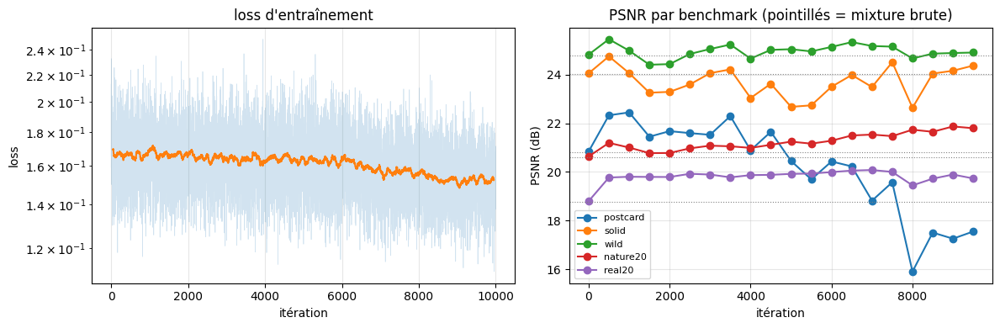

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

w = 100                                    # moyenne glissante, la loss brute est bruitée
sm = np.convolve(hist["loss"], np.ones(w) / w, mode="valid")
ax[0].plot(hist["loss"], alpha=.2, lw=.5)
ax[0].plot(np.arange(len(sm)) + w // 2, sm)
ax[0].set_yscale("log"); ax[0].set_xlabel("itération"); ax[0].set_ylabel("loss")
ax[0].set_title("loss d'entraînement"); ax[0].grid(alpha=.3)

its = [i for i, _ in hist["eval"]]
for name in hist["eval"][0][1]:
    ax[1].plot(its, [r[name][0] for _, r in hist["eval"]], marker="o", label=name)
    ax[1].axhline(hist["eval"][0][1][name][1], ls=":", lw=.8, color="gray")
ax[1].set_xlabel("itération"); ax[1].set_ylabel("PSNR (dB)")
ax[1].set_title("PSNR par benchmark (pointillés = mixture brute)")
ax[1].legend(fontsize=8); ax[1].grid(alpha=.3)
fig.tight_layout(); plt.show()

In [12]:
# loss d'un modèle identité (pred = m) sur ta distribution : la référence "ne rien faire"
IDENTITY = {"pixel": 0.1210, "perceptual": 0.3601, "gradient": 0.0028}

def plot_parts(hist, w=100, baseline=IDENTITY):
    """Chaque terme de la loss au cours des itérations, avec la référence identité."""
    parts, it = hist["parts"], np.asarray(hist["iter"])
    keys = list(parts[0])
    arr = {k: np.asarray([p[k] for p in parts]) for k in keys}
    w = min(w, max(1, len(it) // 4))
    smooth = lambda y: np.convolve(y, np.ones(w) / w, mode="valid")

    fig, ax = plt.subplots(1, 2, figsize=(13, 4.2))
    for i, k in enumerate(keys):
        c = f"C{i}"
        ax[0].plot(it, arr[k], color=c, alpha=.15, lw=.5)
        ax[0].plot(it[w - 1:], smooth(arr[k]), color=c, lw=1.8, label=k)
        if baseline and k in baseline:
            ax[0].axhline(baseline[k], color=c, ls=":", lw=1)
    ax[0].set_yscale("log")
    ax[0].set_xlabel("itération"); ax[0].set_ylabel("terme pondéré (log)")
    ax[0].set_title("Termes de la loss  (pointillés = modèle identité)")
    ax[0].legend(fontsize=9); ax[0].grid(alpha=.3)

    tot = sum(arr[k] for k in keys)
    bottom = np.zeros(len(it) - w + 1)
    for i, k in enumerate(keys):
        share = 100 * smooth(arr[k]) / smooth(tot)
        ax[1].fill_between(it[w - 1:], bottom, bottom + share, color=f"C{i}",
                           alpha=.75, label=k)
        bottom += share
    ax[1].set_ylim(0, 100); ax[1].set_xlabel("itération")
    ax[1].set_ylabel("part du total (%)")
    ax[1].set_title("Qui domine la loss ?")
    ax[1].legend(fontsize=9, loc="center right")
    fig.tight_layout(); plt.show()

    print(f"{'terme':12s} {'identité':>9s} {'début':>9s} {'fin':>9s} {'vs identité':>12s}")
    for k in keys:
        a, b = arr[k][:200].mean(), arr[k][-200:].mean()
        ref = baseline.get(k) if baseline else None
        pct = f"{100*b/ref:9.0f} %" if ref else "        -"
        print(f"{k:12s} {ref if ref else float('nan'):9.4f} {a:9.4f} {b:9.4f} {pct:>12s}")


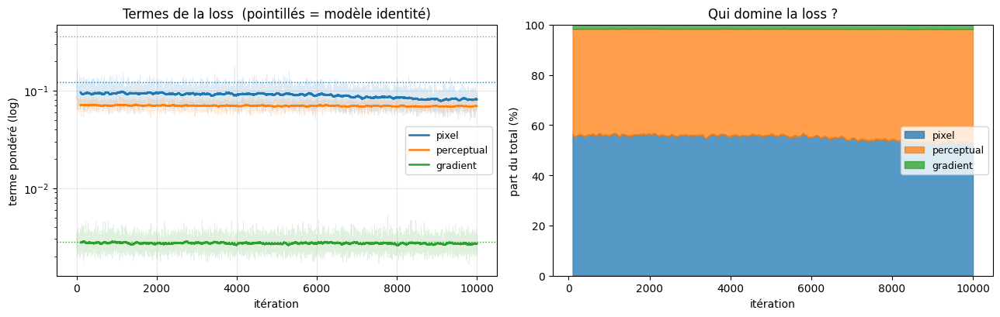

terme         identité     début       fin  vs identité
pixel           0.1210    0.0944    0.0804         66 %
perceptual      0.3601    0.0709    0.0687         19 %
gradient        0.0028    0.0028    0.0027         96 %


In [13]:
plot_parts(hist)

In [14]:
@torch.no_grad()
def show_results(net, n=5, size=224, seed=0, amplify=3.0, datasets=None):
    """n images de chaque jeu de test : m | prédiction | cible | ce qui a été retiré."""
    was_training = net.training
    net.eval()
    specs = eval_specs()
    if datasets:
        specs = {k: v for k, v in specs.items() if k in datasets}

    for name, samples in specs.items():
        ds = PairedImageDataset(samples, size=size, train=False, jpeg=None, source=name)
        idx = np.random.default_rng(seed).choice(len(ds), min(n, len(ds)), replace=False)
        batch = torch.utils.data.default_collate([ds[int(i)] for i in idx])

        m = batch["mixed"].to(DEVICE)
        t = batch["transmission"].to(DEVICE)
        with torch.amp.autocast(DEVICE, enabled=(DEVICE == "cuda")):
            pred = net(m)
        pred = pred.float().clamp(0, 1)

        # PSNR par image, modèle contre "ne rien faire"
        mse = lambda a, b: (a - b).pow(2).flatten(1).mean(1)
        p_model = 10 * torch.log10(1 / mse(pred, t).clamp_min(1e-10))
        p_base = 10 * torch.log10(1 / mse(m, t).clamp_min(1e-10))

        k = len(idx)
        fig, ax = plt.subplots(k, 4, figsize=(13, 3.3 * k), squeeze=False)
        for r in range(k):
            removed = ((m[r] - pred[r]) * amplify).clamp(0, 1)
            panels = [(m[r], "entrée m"), (pred[r], "prédiction"),
                      (t[r], "cible t"), (removed, f"m − pred  (x{amplify:g})")]
            for c, (img, lab) in enumerate(panels):
                ax[r, c].imshow(img.permute(1, 2, 0).cpu().numpy())
                ax[r, c].set_title(lab, fontsize=9)
                ax[r, c].set_xticks([]); ax[r, c].set_yticks([])
            gain = p_model[r] - p_base[r]
            ax[r, 0].set_ylabel(f"{p_model[r]:.1f} dB\n({gain:+.1f} vs brut)",
                                fontsize=8,
                                color="green" if gain > 0 else "crimson")
        fig.suptitle(f"{name}  —  modèle {p_model.mean():.2f} dB   "
                     f"mixture brute {p_base.mean():.2f} dB", fontsize=12, y=1.0)
        fig.tight_layout()
        plt.show()

    net.train(was_training)


it   9000  loss 0.2925  |  PSNR modèle/mixture : postcard 19.38/20.45  solid 29.35/24.75  wild 25.59/24.89  nature20 22.66/20.62  real20 20.71/18.78

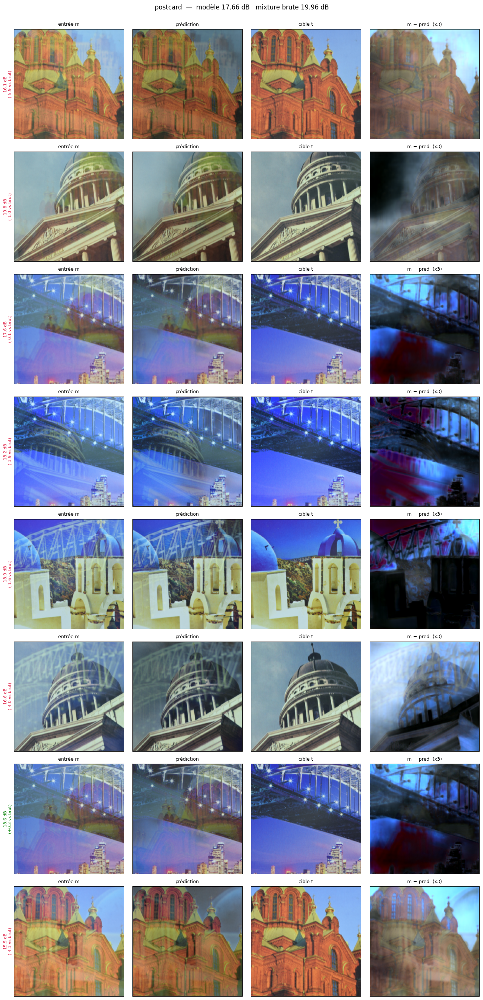

In [15]:
show_results(model, n=8, datasets=["postcard"])

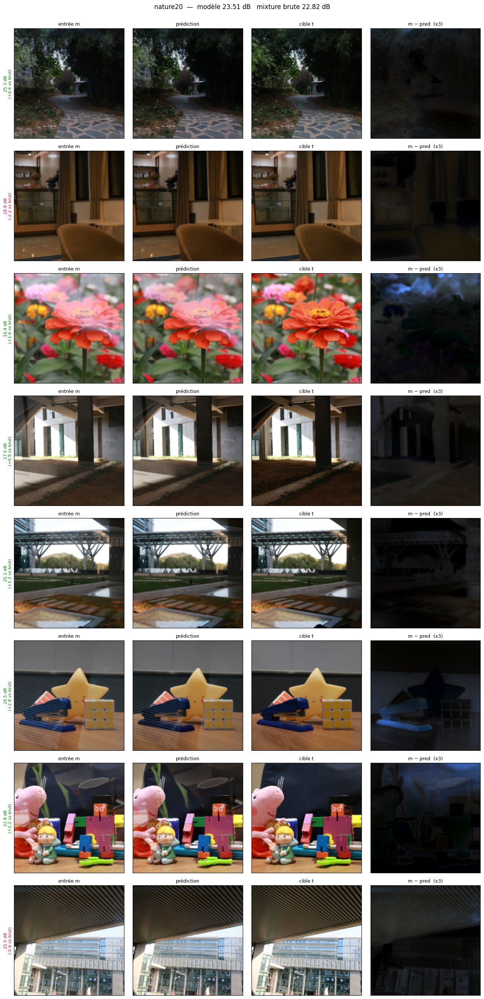

In [14]:
show_results(model, n=8, datasets=["nature20"])

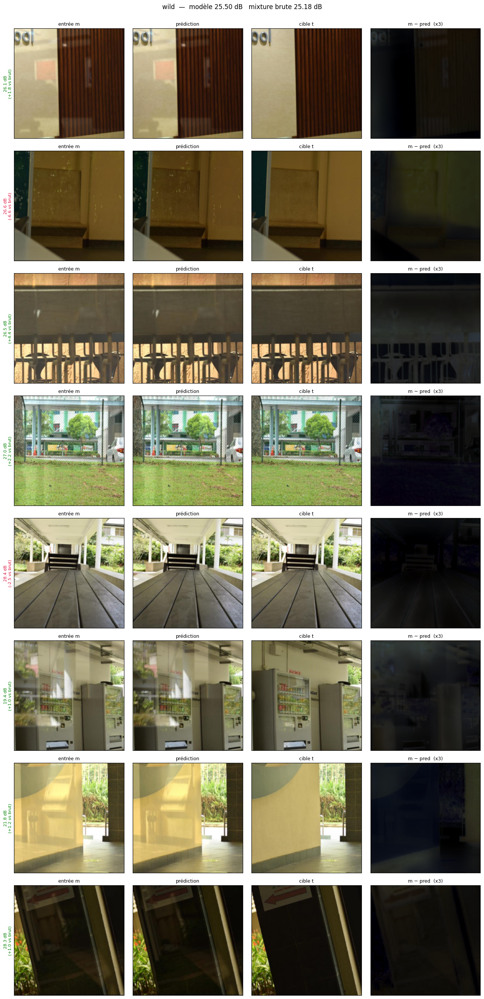

In [15]:
show_results(model, n=8, datasets=["wild"])

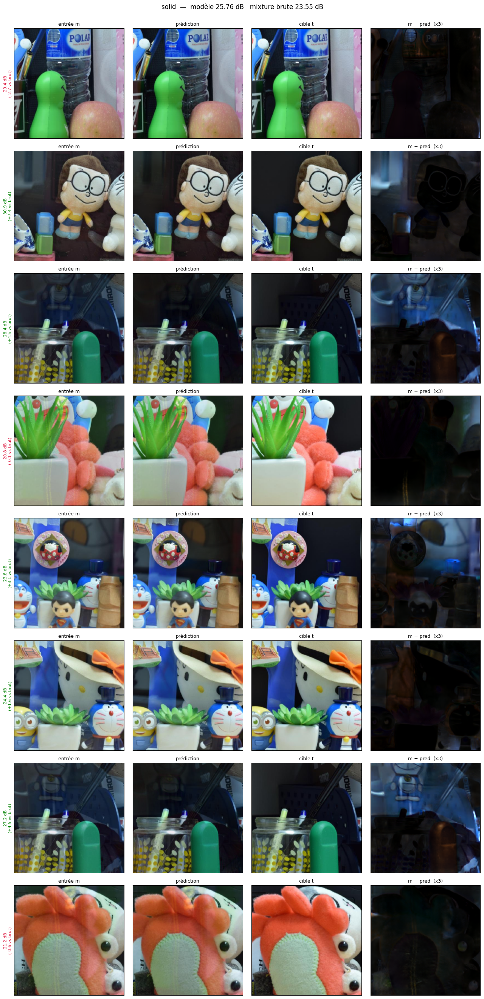

In [24]:

show_results(model, n=8, datasets=["solid"])   # les plus durs
# show_results(model, n=3, amplify=1.0)                       # intensités réelles
# show_results(model, n=5, seed=7)                            # d'autres images